In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import pandas as pd
import math

import matplotlib.image as mpimg

#from itertools import cycle

from astropy.io import fits
from astropy.table import Table
from astropy.visualization import astropy_mpl_style
#from astropy.visualization import simple_norm
#from PyAstronomy import pyasl

#from astropy.nddata import Cutout2D
from astropy import units as u
#from astropy.wcs import WCS
from astropy import constants as const

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.size'] = 8
plt.rcParams['xtick.minor.size'] = 4
plt.rcParams['ytick.major.size'] = 8
plt.rcParams['ytick.minor.size'] = 4

In [2]:
name = ['836713818158557184','1923207523960121344','440342067315501056','572089958400026624','2026726824985257984','318786936665827328']
ra = ['347.92526','217.62451','6.662846','165.64119','201.21472','176.70558']
dec = ['15.110629','13.653346','0.91070795','2.6064985','10.767238','0.8961036']
dicty = {'SID':name, 'RA':ra, 'DEC':dec}

data = pd.DataFrame(dicty)
#df['Ha_net']=df['Ha_max']-df['Ha_con']
data

,SID,RA,DEC
0,836713818158557184,347.92526,15.110629
1,1923207523960121344,217.62451,13.653346
2,440342067315501056,6.662846,0.91070795
3,572089958400026624,165.64119,2.6064985
4,2026726824985257984,201.21472,10.767238
5,318786936665827328,176.70558,0.8961036


In [3]:
img_1 = mpimg.imread('images/836713818158557184.png')
img_2 = mpimg.imread('images/1923207523960121344.png')
img_3 = mpimg.imread('images/440342067315501056.png')
img_4 = mpimg.imread('images/572089958400026624.png')
img_5 = mpimg.imread('images/2026726824985257984.png')
img_6 = mpimg.imread('images/318786936665827328.png')

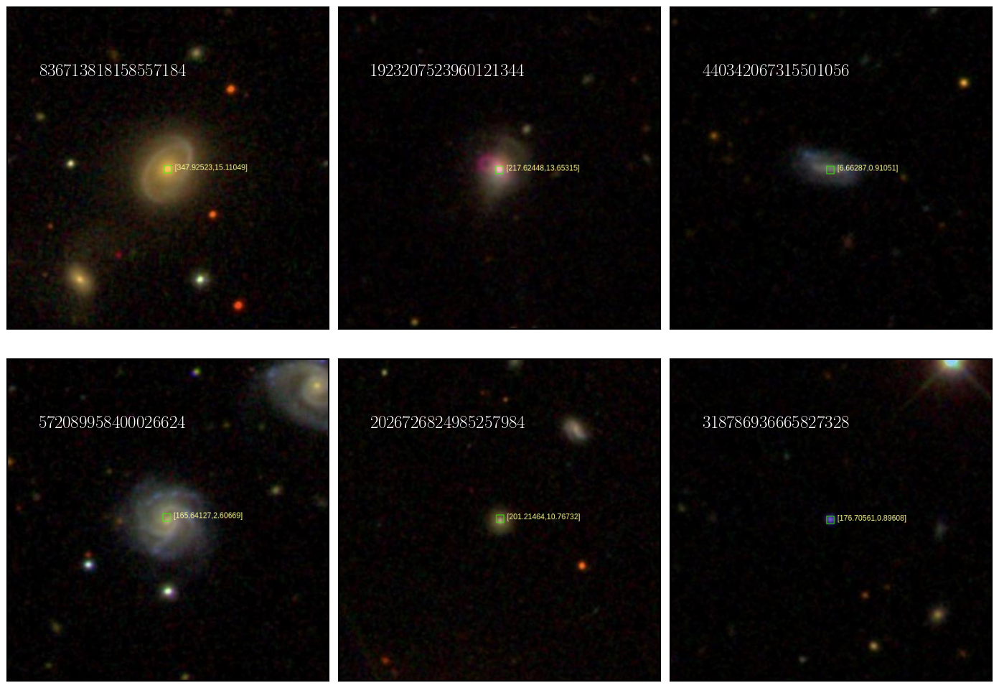

In [4]:
plt.figure(figsize=(14,10))
#fig = plt.axes()
#gs = fig.add_gridspec(2,3, hspace=0.15, wspace=0)
#(ax1, ax2, ax3), (ax4, ax5, ax6) = gs.subplots(sharex='col', sharey='row')
#fig.suptitle('Galaxies images', size=20)
ax1 = plt.axes([0.01,0.5,0.32,0.47])
ax2 = plt.axes([0.34,0.5,0.32,0.47])
ax3 = plt.axes([0.67,0.5,0.32,0.47])
ax4 = plt.axes([0.01,0.01,0.32,0.47])
ax5 = plt.axes([0.34,0.01,0.32,0.47])
ax6 = plt.axes([0.67,0.01,0.32,0.47])


#1
ax1.imshow(img_1)
ax1.text(0.10, 0.80,str(data['SID'][0]), color='white', fontsize='18', horizontalalignment='left',
         verticalalignment='center', transform=ax1.transAxes)
ax1.tick_params(top=False, bottom=False, right=False, left=False,
               labelbottom=False, labelleft=False)
#2
ax2.imshow(img_2)
ax2.text(0.10, 0.80,str(data['SID'][1]), color='white', fontsize='18', horizontalalignment='left',
         verticalalignment='center', transform=ax2.transAxes)
ax2.tick_params(top=False, bottom=False, right=False, left=False,
               labelbottom=False, labelleft=False)
#3
ax3.imshow(img_3)
ax3.text(0.10, 0.80,str(data['SID'][2]), color='white', fontsize='18', horizontalalignment='left',
         verticalalignment='center', transform=ax3.transAxes)
ax3.tick_params(top=False, bottom=False, right=False, left=False,
               labelbottom=False, labelleft=False)
#4
ax4.imshow(img_4)
ax4.text(0.10, 0.80,str(data['SID'][3]), color='white', fontsize='18', horizontalalignment='left',
         verticalalignment='center', transform=ax4.transAxes)
ax4.tick_params(top=False, bottom=False, right=False, left=False,
               labelbottom=False, labelleft=False)
#5
ax5.imshow(img_5)
ax5.text(0.10, 0.80,str(data['SID'][4]), color='white', fontsize='18', horizontalalignment='left',
         verticalalignment='center', transform=ax5.transAxes)
ax5.tick_params(top=False, bottom=False, right=False, left=False,
               labelbottom=False, labelleft=False)
#6
ax6.imshow(img_6)
ax6.text(0.10, 0.80,str(data['SID'][5]), color='white', fontsize='18', horizontalalignment='left',
         verticalalignment='center', transform=ax6.transAxes)
ax6.tick_params(top=False, bottom=False, right=False, left=False,
               labelbottom=False, labelleft=False)

#plt.savefig('images.jpg')

In [5]:
#gal_1['Wavelength'] = gal_1['Wavelength'].astype(float)
#gal_1['Wavelength'].unique()

columnas = ['Wavelength', 'Flux', 'BestFit', 'SkyFlux']
gal_1 = pd.read_csv('spectra/836713818158557184.csv', delimiter = ",", names=columnas, comment='#')
gal_2 = pd.read_csv('spectra/1923207523960121344.csv', delimiter = ",", names=columnas, comment='#')
gal_3 = pd.read_csv('spectra/440342067315501056.csv', delimiter = ",", names=columnas, comment='#')
gal_4 = pd.read_csv('spectra/572089958400026624.csv', delimiter = ",", names=columnas, comment='#')
gal_5 = pd.read_csv('spectra/2026726824985257984.csv', delimiter = ",", names=columnas, comment='#')
gal_6 = pd.read_csv('spectra/318786936665827328.csv', delimiter = ",", names=columnas, comment='#')

In [6]:
gal_1['Residual'] = gal_1['Flux']-gal_1['BestFit']
gal_1

,Wavelength,Flux,BestFit,SkyFlux,Residual
0,3822.082,29.203,21.321,10.405,7.882
1,3822.963,35.287,20.902,10.123,14.385
2,3823.842,31.285,20.284,9.814,11.001
3,3824.724,21.125,20.381,9.473,0.744
4,3825.604,19.489,20.032,9.052,-0.543
...,...,...,...,...,...
3812,9193.905,93.776,90.868,4.202,2.908
3813,9196.020,85.918,90.561,4.637,-4.643
3814,9198.141,91.356,90.603,4.828,0.753
3815,9200.257,89.575,91.090,4.736,-1.515


## 836713818158557184

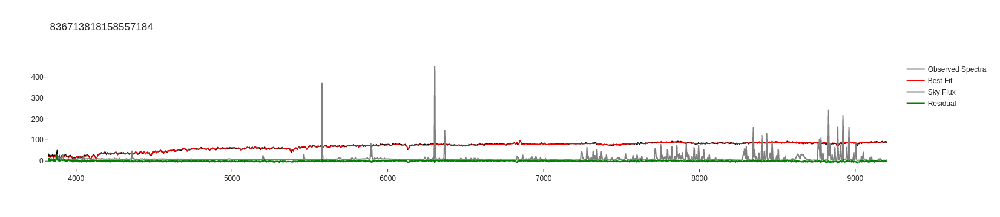

In [7]:
import plotly.express as px
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

fig.add_trace(go.Scatter(x=gal_1['Wavelength'], y=gal_1['Flux'], name='Observed Spectra',
                         line=dict(color='black', width=1.5)))
fig.add_trace(go.Scatter(x=gal_1['Wavelength'], y=gal_1['BestFit'], name='Best Fit',
                         line=dict(color='red', width=1.5)))
fig.add_trace(go.Scatter(x=gal_1['Wavelength'], y=gal_1['SkyFlux'], name='Sky Flux',
                         line=dict(color='gray', width=2)))
fig.add_trace(go.Scatter(x=gal_1['Wavelength'], y=gal_1['Residual'], name='Residual',
                         line=dict(color='green', width=2)))

fig.update_layout(template='simple_white', title=data['SID'][0])

# ANOTHER WAY TO QUICKLY PLOT A LOT OF DATA WITH THE SAME X-AXIS
#fig = px.line(gal_1, x='Wavelength', y=['Flux','BestFit','SkyFlux'])
#fig.update_layout(template='simple_white', title=data['SID'][0])
#fig.show()

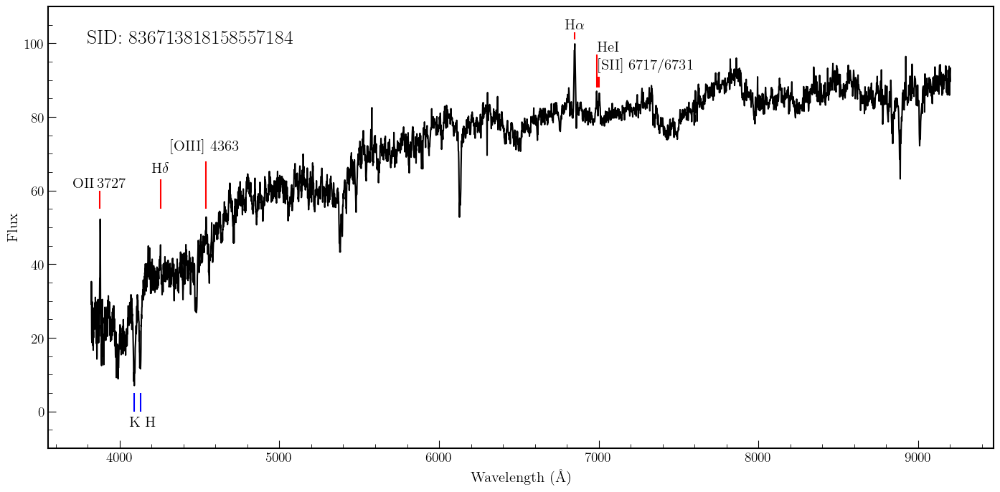

In [8]:
plt.figure(figsize=(17,8))
plt.plot(gal_1['Wavelength'], gal_1['Flux'], color='black', label='Observed spectra')
#plt.plot(gal_1['Wavelength'], gal_1['BestFit'], color='red', label='Best Fit')
#plt.plot(gal_1['Wavelength'], gal_1['SkyFlux'], color='gray', label='Sky Flux')
#plt.plot(gal_1['Wavelength'], gal_1['Residual'], color='green', label='Residual')

plt.text(3800,100,'SID: '+data['SID'][0], fontsize=20)
#plt.text(3800,440,'SID: '+data['SID'][0], fontsize=20)
plt.xlabel('Wavelength (\AA)', fontsize=15)
plt.ylabel('Flux', fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.minorticks_on()

plt.ylim(top=110, bottom=-10)
#plt.legend(loc=1, fontsize=15)
plt.vlines(x=3877, ymin=55, ymax=60, color='red', zorder=2)
plt.annotate(r"$\mathrm{OII}\,3727$", (3877, 61), fontsize=15, ha='center')
plt.vlines(x=4255, ymin=55, ymax=63, color='red', zorder=2)
plt.annotate(r"$\mathrm{H}\delta$", (4255, 65), fontsize=15, ha='center')
plt.vlines(x=4541, ymin=55, ymax=68, color='red', zorder=2)
plt.annotate(r"[$\mathrm{O III}$] $4363$", (4541, 71), fontsize=15, ha='center')
plt.vlines(x=6850, ymin=101, ymax=103, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\alpha$', (6850, 104), fontsize=15, ha='center')
plt.vlines(x=6987, ymin=88, ymax=97, color='red', zorder=2)
plt.annotate(r"$\mathrm{He I}$", (6987, 98), fontsize=15, ha='left')
plt.vlines(x=6998, ymin=88, ymax=91, color='red', zorder=2)
plt.vlines(x=7003, ymin=88, ymax=91, color='red', zorder=2)
plt.annotate(r"[$\mathrm{S II}$] $6717/6731$", (6998, 93), fontsize=15, ha='left')
plt.vlines(x=4091, ymin=0, ymax=5, color='blue', zorder=2)
plt.vlines(x=4130, ymin=0, ymax=5, color='blue', zorder=2)
plt.annotate(r'$\mathrm{K}$ H', (4145, -4), fontsize=15, ha='center')

#plt.savefig('spec_imgs/'+data['SID'][0]+'_full.jpg', bbox_inches='tight')
plt.savefig('spec_imgs/'+data['SID'][0]+'_lines.jpg', bbox_inches='tight')

## 1923207523960121344

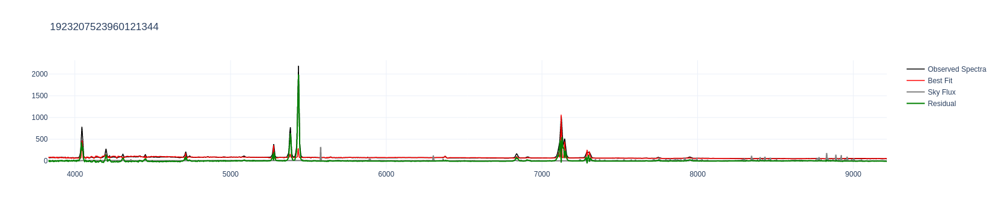

In [9]:
gal_2['Residual'] = gal_2['Flux']-gal_2['BestFit']

fig = go.Figure()
fig.add_trace(go.Scatter(x=gal_2['Wavelength'], y=gal_2['Flux'], name='Observed Spectra',
                         line=dict(color='black', width=1.5)))
fig.add_trace(go.Scatter(x=gal_2['Wavelength'], y=gal_2['BestFit'], name='Best Fit',
                         line=dict(color='red', width=1.5)))
fig.add_trace(go.Scatter(x=gal_2['Wavelength'], y=gal_2['SkyFlux'], name='Sky Flux',
                         line=dict(color='gray', width=2)))
fig.add_trace(go.Scatter(x=gal_2['Wavelength'], y=gal_2['Residual'], name='Residual',
                         line=dict(color='green', width=2)))
fig.update_layout(template='plotly_white', title=data['SID'][1])

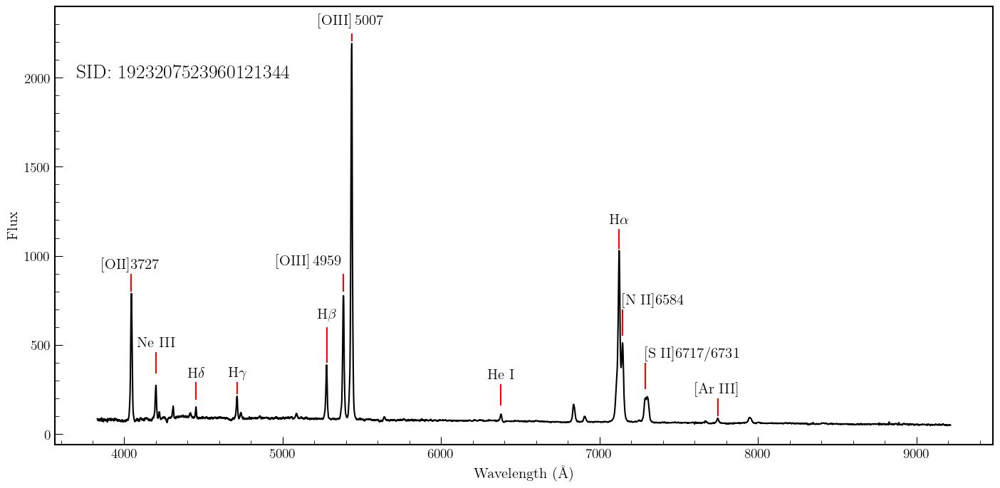

In [10]:
plt.figure(figsize=(17,8))
plt.plot(gal_2['Wavelength'], gal_2['Flux'], color='black', label='Observed spectra')

plt.text(3700,2000,'SID: '+data['SID'][1], fontsize=20, weight='bold')
plt.xlabel('Wavelength (\AA)', fontsize=15)
plt.ylabel('Flux', fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.minorticks_on()
plt.ylim(top=2400)

plt.vlines(x=4044, ymin=800, ymax=900, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O II]3727}$', (4044, 930), fontsize=15, ha='center')
plt.vlines(x=4199, ymin=340, ymax=460, color='red', zorder=2)
plt.annotate('Ne III', (4199, 490), fontsize=15, ha='center')
plt.vlines(x=4452, ymin=190, ymax=290, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\delta$', (4452, 320), fontsize=15, ha='center')
plt.vlines(x=4711, ymin=225, ymax=290, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\gamma$', (4711, 320), fontsize=15, ha='center')
plt.vlines(x=5277, ymin=400, ymax=600, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\beta$', (5277, 650), fontsize=15, ha='center')
plt.vlines(x=5383, ymin=800, ymax=900, color='red', zorder=2)
plt.annotate(r"[$\mathrm{OIII}]\,4959$", (5383, 950), fontsize=15, ha='right')
plt.vlines(x=5436, ymin=2205, ymax=2250, color='red', zorder=2)
plt.annotate(r"[$\mathrm{OIII}]\,5007$", (5436, 2300), fontsize=15, ha='center')
plt.vlines(x=6378, ymin=160, ymax=280, color='red', zorder=2)
plt.annotate(r'He I', (6378, 310), fontsize=15, ha='center')
plt.vlines(x=7123, ymin=1040, ymax=1150, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\alpha$', (7123, 1180), fontsize=15, ha='center')
plt.vlines(x=7144, ymin=550, ymax=700, color='red', zorder=2)
plt.annotate(r'[N II]$6584$', (7144, 730), fontsize=15, ha='left')
plt.vlines(x=7291, ymin=250, ymax=400, color='red', zorder=2)
plt.annotate(r'[S II]$6717/6731$', (7291, 430), fontsize=15)
plt.vlines(x=7746, ymin=100, ymax=200, color='red', zorder=2)
plt.annotate(r'[Ar III]', (7746, 230), fontsize=15, ha='center')

plt.savefig('spec_imgs/'+data['SID'][1]+'_lines.jpg', bbox_inches='tight')

## 440342067315501056

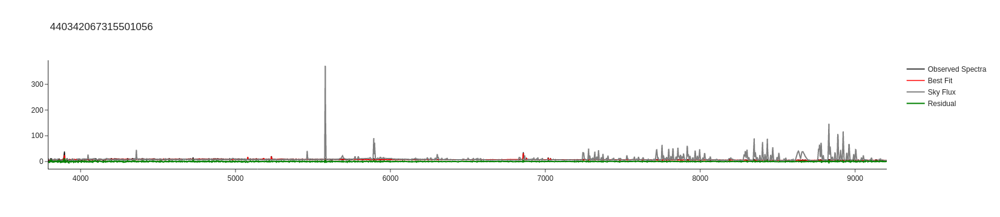

In [11]:
gal_3['Residual'] = gal_3['Flux']-gal_3['BestFit']

fig = go.Figure()
fig.add_trace(go.Scatter(x=gal_3['Wavelength'], y=gal_3['Flux'], name='Observed Spectra',
                         line=dict(color='black', width=1.5)))
fig.add_trace(go.Scatter(x=gal_3['Wavelength'], y=gal_3['BestFit'], name='Best Fit',
                         line=dict(color='red', width=1.5)))
fig.add_trace(go.Scatter(x=gal_3['Wavelength'], y=gal_3['SkyFlux'], name='Sky Flux',
                         line=dict(color='gray', width=2)))
fig.add_trace(go.Scatter(x=gal_3['Wavelength'], y=gal_3['Residual'], name='Residual',
                         line=dict(color='green', width=2)))
fig.update_layout(template='simple_white', title=data['SID'][2])

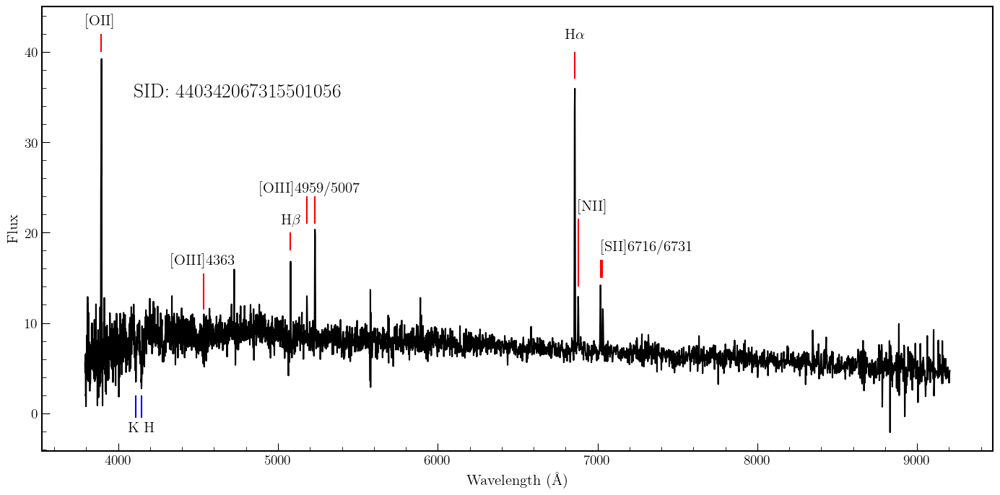

In [12]:
plt.figure(figsize=(17,8))
plt.plot(gal_3['Wavelength'], gal_3['Flux'], color='black', label='Observed spectra')

plt.text(4100,35,'SID: '+data['SID'][2], fontsize=20, weight='bold')
plt.xlabel('Wavelength (\AA)', fontsize=15)
plt.ylabel('Flux', fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.minorticks_on()
plt.ylim(top=45)

plt.vlines(x=3895, ymin=40, ymax=42, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O II]}$', (3895, 43), fontsize=15, ha='center')
plt.vlines(x=4536, ymin=11.5, ymax=15.5, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O III]4363}$', (4536, 16.5), fontsize=15, ha='center')
plt.vlines(x=5079, ymin=18, ymax=20, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\beta$', (5079, 21), fontsize=15, ha='center')
plt.vlines(x=5180, ymin=21, ymax=24, color='red', zorder=2)
plt.vlines(x=5231, ymin=21, ymax=24, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O III] 4959/5007}$', (5205, 24.5), fontsize=15, ha='center')
plt.vlines(x=6858, ymin=37, ymax=40, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\alpha$', (6858, 41.5), fontsize=15, ha='center')
plt.vlines(x=6878, ymin=14, ymax=21.5, color='red', zorder=2)
plt.annotate(r'$\mathrm{[N II]}$', (6878, 22.5), fontsize=15, ha='left')
plt.vlines(x=7019, ymin=15, ymax=17, color='red', zorder=2)
plt.vlines(x=7031, ymin=15, ymax=17, color='red', zorder=2)
plt.annotate(r'$\mathrm{[S II]6716/6731}$', (7025, 18), fontsize=15, ha='left')
plt.vlines(x=4110, ymin=-0.5, ymax=2, color='blue', zorder=2)
plt.vlines(x=4145, ymin=-0.5, ymax=2, color='blue', zorder=2)
plt.annotate(r'$\mathrm{K}$ H', (4145, -2), fontsize=15, ha='center')

plt.savefig('spec_imgs/'+data['SID'][2]+'_lines.jpg', bbox_inches='tight')

## 572089958400026624

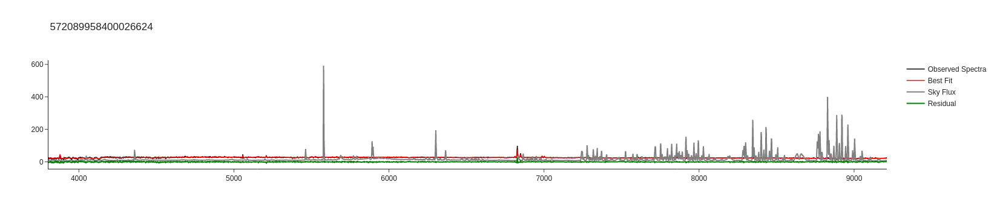

In [13]:
gal_4['Residual'] = gal_4['Flux']-gal_4['BestFit']

fig = go.Figure()
fig.add_trace(go.Scatter(x=gal_4['Wavelength'], y=gal_4['Flux'], name='Observed Spectra',
                         line=dict(color='black', width=1.5)))
fig.add_trace(go.Scatter(x=gal_4['Wavelength'], y=gal_4['BestFit'], name='Best Fit',
                         line=dict(color='red', width=1.5)))
fig.add_trace(go.Scatter(x=gal_4['Wavelength'], y=gal_4['SkyFlux'], name='Sky Flux',
                         line=dict(color='gray', width=2)))
fig.add_trace(go.Scatter(x=gal_4['Wavelength'], y=gal_4['Residual'], name='Residual',
                         line=dict(color='green', width=2)))
fig.update_layout(template='simple_white', title=data['SID'][3])

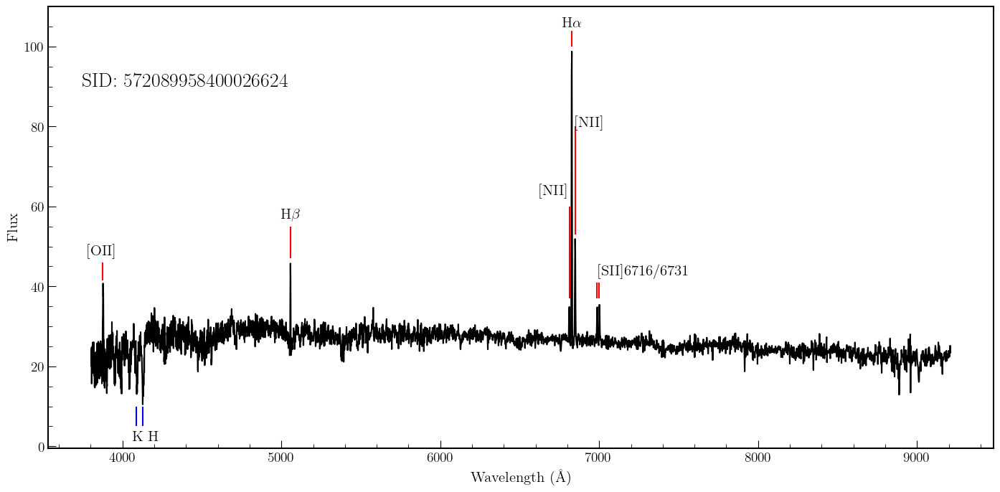

In [14]:
plt.figure(figsize=(17,8))
plt.plot(gal_4['Wavelength'], gal_4['Flux'], color='black', label='Observed spectra')

plt.text(3750,90,'SID: '+data['SID'][3], fontsize=20, weight='bold')
plt.xlabel('Wavelength (\AA)', fontsize=15)
plt.ylabel('Flux', fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.minorticks_on()
plt.ylim(top=110,bottom=-0.5)

plt.vlines(x=3877, ymin=41.5, ymax=46, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O II]}$', (3877, 48), fontsize=15, ha='center')
plt.vlines(x=5057, ymin=47, ymax=55, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\beta$', (5057, 57), fontsize=15, ha='center')
plt.vlines(x=6828, ymin=100, ymax=104, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\alpha$', (6828, 105), fontsize=15, ha='center')
plt.vlines(x=6812, ymin=37, ymax=60, color='red', zorder=2)
plt.annotate(r'$\mathrm{[N II]}$', (6812, 63), fontsize=15, ha='right')
plt.vlines(x=6848, ymin=53, ymax=80, color='red', zorder=2)
plt.annotate(r'$\mathrm{[N II]}$', (6848, 80), fontsize=15, ha='left')
plt.vlines(x=6987, ymin=37, ymax=41, color='red', zorder=2)
plt.vlines(x=7001, ymin=37, ymax=41, color='red', zorder=2)
plt.annotate(r'$\mathrm{[S II]6716/6731}$', (6994, 43), fontsize=15, ha='left')
plt.vlines(x=4089, ymin=5, ymax=10, color='blue', zorder=2)
plt.vlines(x=4127, ymin=5, ymax=10, color='blue', zorder=2)
plt.annotate(r'$\mathrm{K}$ H', (4145, 4), fontsize=15, ha='center', va='top')

plt.savefig('spec_imgs/'+data['SID'][3]+'_lines.jpg', bbox_inches='tight')

## 2026726824985257984

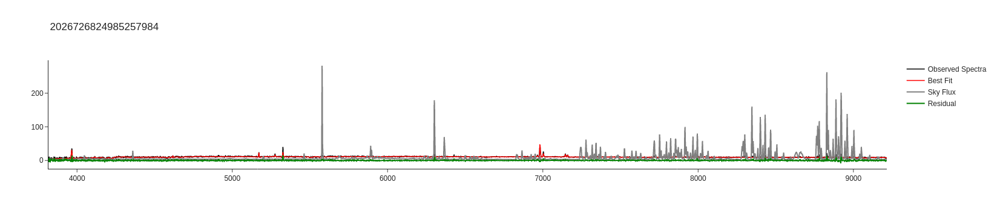

In [15]:
gal_5['Residual'] = gal_5['Flux']-gal_5['BestFit']

fig = go.Figure()
fig.add_trace(go.Scatter(x=gal_5['Wavelength'], y=gal_5['Flux'], name='Observed Spectra',
                         line=dict(color='black', width=1.5)))
fig.add_trace(go.Scatter(x=gal_5['Wavelength'], y=gal_5['BestFit'], name='Best Fit',
                         line=dict(color='red', width=1.5)))
fig.add_trace(go.Scatter(x=gal_5['Wavelength'], y=gal_5['SkyFlux'], name='Sky Flux',
                         line=dict(color='gray', width=2)))
fig.add_trace(go.Scatter(x=gal_5['Wavelength'], y=gal_5['Residual'], name='Residual',
                         line=dict(color='green', width=2)))
fig.update_layout(template='simple_white', title=data['SID'][4])

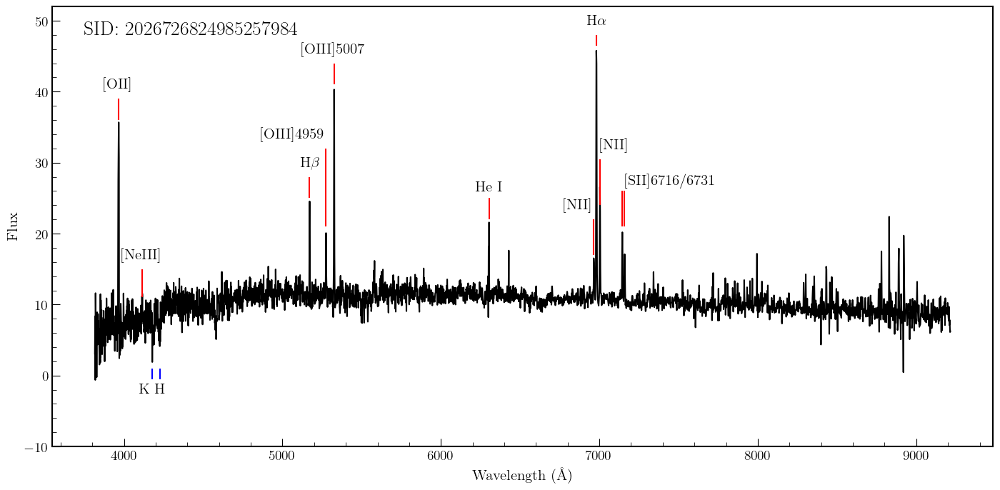

In [16]:
plt.figure(figsize=(17,8))
plt.plot(gal_5['Wavelength'], gal_5['Flux'], color='black', label='Observed spectra')

plt.text(3750,50,'SID: '+data['SID'][4], fontsize=20, va='top')
plt.xlabel('Wavelength (\AA)', fontsize=15)
plt.ylabel('Flux', fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.minorticks_on()
plt.ylim(top=52,bottom=-10)

plt.vlines(x=3966, ymin=36, ymax=39, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O II]}$', (3966, 40.5), fontsize=15, ha='center')
plt.vlines(x=4115, ymin=11, ymax=15, color='red', zorder=2)
plt.annotate(r'$\mathrm{[Ne III]}$', (4115, 16.5), fontsize=15, ha='center')
plt.vlines(x=5171, ymin=25, ymax=28, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\beta$', (5171, 29.5), fontsize=15, ha='center')
plt.vlines(x=5274, ymin=21, ymax=32, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O III]4959}$', (5274, 33.5), fontsize=15, ha='right')
plt.vlines(x=5325, ymin=41, ymax=44, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O III]5007}$', (5325, 45.5), fontsize=15, ha='center')
plt.vlines(x=6303, ymin=22, ymax=25, color='red', zorder=2)
plt.annotate(r'$\mathrm{He\ I}$', (6303, 26), fontsize=15, ha='center')
plt.vlines(x=6980, ymin=46.5, ymax=48, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\alpha$', (6980, 49.5), fontsize=15, ha='center')
plt.vlines(x=6964, ymin=17, ymax=22, color='red', zorder=2)
plt.annotate(r'$\mathrm{[N II]}$', (6964, 23.5), fontsize=15, ha='right')
plt.vlines(x=7003, ymin=24, ymax=30.5, color='red', zorder=2)
plt.annotate(r'$\mathrm{[N II]}$', (7003, 32), fontsize=15, ha='left')
plt.vlines(x=7144, ymin=21, ymax=26, color='red', zorder=2)
plt.vlines(x=7159, ymin=21, ymax=26, color='red', zorder=2)
plt.annotate(r'$\mathrm{[S II]6716/6731}$', (7161, 27), fontsize=15, ha='left')
plt.vlines(x=4178, ymin=-0.5, ymax=1, color='blue', zorder=2)
plt.vlines(x=4225, ymin=-0.5, ymax=1, color='blue', zorder=2)
plt.annotate(r'$\mathrm{K}$ H', (4178, -1), fontsize=15, ha='center', va='top')

plt.savefig('spec_imgs/'+data['SID'][4]+'_lines.jpg', bbox_inches='tight')

## 318786936665827328

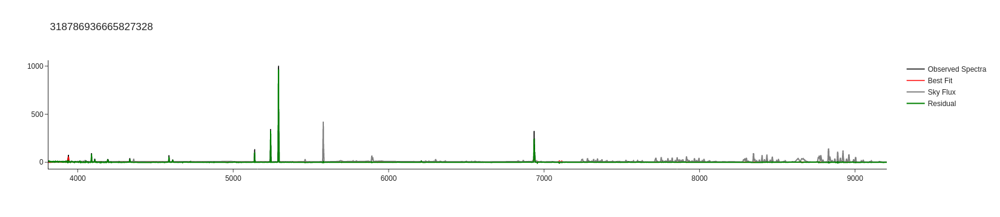

In [17]:
gal_6['Residual'] = gal_6['Flux']-gal_6['BestFit']

fig = go.Figure()
fig.add_trace(go.Scatter(x=gal_6['Wavelength'], y=gal_6['Flux'], name='Observed Spectra',
                         line=dict(color='black', width=1.5)))
fig.add_trace(go.Scatter(x=gal_6['Wavelength'], y=gal_6['BestFit'], name='Best Fit',
                         line=dict(color='red', width=1.5)))
fig.add_trace(go.Scatter(x=gal_6['Wavelength'], y=gal_6['SkyFlux'], name='Sky Flux',
                         line=dict(color='gray', width=2)))
fig.add_trace(go.Scatter(x=gal_6['Wavelength'], y=gal_6['Residual'], name='Residual',
                         line=dict(color='green', width=2)))
fig.update_layout(template='simple_white', title=data['SID'][5])

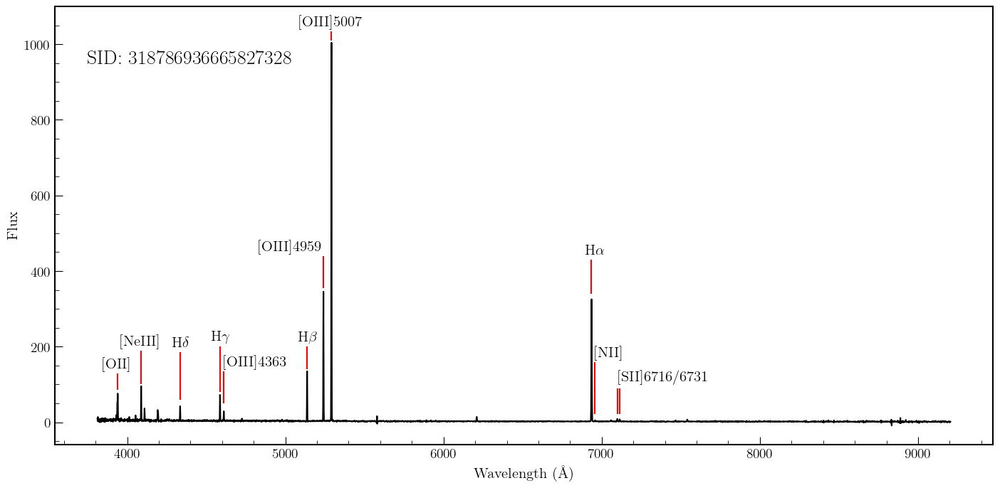

In [18]:
plt.figure(figsize=(17,8))
plt.plot(gal_6['Wavelength'], gal_6['Flux'], color='black', label='Observed spectra')

plt.text(3750,950,'SID: '+data['SID'][5], fontsize=20, weight='bold')
plt.xlabel('Wavelength (\AA)', fontsize=15)
plt.ylabel('Flux', fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.minorticks_on()
plt.ylim(top=1100)

plt.vlines(x=3940, ymin=85, ymax=130, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O II]}$', (3940, 145), fontsize=15, ha='center')
plt.vlines(x=4088, ymin=100, ymax=190, color='red', zorder=2)
plt.annotate(r'$\mathrm{[Ne III]}$', (4088, 205), fontsize=15, ha='center')
plt.vlines(x=4611, ymin=50, ymax=135, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O III]4363}$', (4611, 150), fontsize=15, ha='left')

plt.vlines(x=4335, ymin=60, ymax=185, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\delta$', (4335, 200), fontsize=15, ha='center')
plt.vlines(x=4586, ymin=80, ymax=200, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\gamma$', (4586, 215), fontsize=15, ha='center')
plt.vlines(x=5138, ymin=140, ymax=200, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\beta$', (5138, 215), fontsize=15, ha='center')

plt.vlines(x=5240, ymin=355, ymax=440, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O III]4959}$', (5240, 455), fontsize=15, ha='right')
plt.vlines(x=5291, ymin=1010, ymax=1035, color='red', zorder=2)
plt.annotate(r'$\mathrm{[O III]5007}$', (5291, 1050), fontsize=15, ha='center')

plt.vlines(x=6935, ymin=340, ymax=430, color='red', zorder=2)
plt.annotate(r'$\mathrm{H}\alpha$', (6955, 445), fontsize=15, ha='center')

plt.vlines(x=6958, ymin=21, ymax=160, color='red', zorder=2)
plt.annotate(r'$\mathrm{[N II]}$', (6958, 175), fontsize=15, ha='left')

plt.vlines(x=7099, ymin=21, ymax=90, color='red', zorder=2)
plt.vlines(x=7113, ymin=21, ymax=90, color='red', zorder=2)
plt.annotate(r'$\mathrm{[S II]6716/6731}$', (7105, 110), fontsize=15, ha='left')

plt.savefig('spec_imgs/'+data['SID'][5]+'_lines.jpg', bbox_inches='tight')

## Ejercicio 2

In [19]:
spec = Table.read('PARENT_SAMPLE_MPA-JHU.fits', format='fits')
dat = Table(spec[0])
dat.add_row(spec[1])
dat.remove_row(0)
dat.remove_row(0)

dat = Table(spec[0])
dat.remove_row(0)
for i in range(len(spec)):
    for j in range(len(data)):
        if int(data['SID'][j]) == int(spec['SPECOBJID'][i]):
            dat.add_row(spec[i])

In [20]:
galax = ['gal 6', 'gal 3','gal 4','gal 1','gal 2','gal 5']
dat.add_column(galax, name='gal_ID')
dat

SPECOBJID,PLATEID,MJD,FIBERID,RA,DEC,"OII_3727,29","eOII_3727,29",SNR(OII),NEIII_3869_FLUX,NEIII_3869_FLUX_ERR,SNR(NeIII),OIII_4363_FLUX,OIII_4363_FLUX_ERR,SNR(O4363),H_BETA_FLUX,H_BETA_FLUX_ERR,SNR(Hb),OIII_5007_FLUX,OIII_5007_FLUX_ERR,SNR(OIII),OI_6300_FLUX,OI_6300_FLUX_ERR,SNR(OI),NII_6548_FLUX,NII_6548_FLUX_ERR,SNR(N6548),H_ALPHA_FLUX,H_ALPHA_FLUX_ERR,SNR(Ha),NII_6584_FLUX,NII_6584_FLUX_ERR,SNR(NII),SII_6717_FLUX,SII_6717_FLUX_ERR,SNR(S6717),SII_6731_FLUX,SII_6731_FLUX_ERR,SNR(S6731),H_BETA_EQW,H_BETA_EQW_ERR,OIII_5007_EQW,OIII_5007_EQW_ERR,H_ALPHA_EQW,H_ALPHA_EQW_ERR,gal_ID
bytes19,int16,int32,int16,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,str5
318786936665827328,283,51959,572,176.70558,0.8961036,223.24313,5.382010213251817,41.47950760019798,151.5907,3.6106317,41.984535,46.890247,1.8222684,25.731802,292.9207,3.6536107,80.172935,2033.6875,17.882034,113.727974,3.4491189,0.74986166,4.5996737,2.3063684,0.24640273,9.360158,849.5434,7.438439,114.20991,6.956539,0.74320674,9.360167,19.26706,0.9071905,21.238163,14.948474,0.9598559,15.573665,-130.95781,1.9020237,-820.94415,7.584598,-540.0383,5.00444,gal 6
440342067315501056,391,51782,419,6.662846,0.91070795,111.532684,6.020599607091162,18.52517882019705,-0.2901755,2.9112618,-0.09967345,-3.3242502,2.002536,-1.6600201,30.666027,1.9583952,15.658752,36.884186,2.2815144,16.166536,6.8996377,1.399396,4.93044,7.051995,0.49387908,14.278789,110.42702,2.1597188,51.130276,21.270445,1.4896518,14.278803,28.219212,1.5887487,17.76191,18.172213,1.4444475,12.580736,-4.8238235,0.57831866,-5.204002,0.5741431,-20.021482,0.5280509,gal 3
572089958400026624,508,52366,483,165.64119,2.6064985,85.361145,8.645738519968324,9.87320456458172,3.8104107,4.1942744,0.9084791,6.511065,3.3426821,1.9478564,86.269966,3.290984,26.214035,18.452036,2.970435,6.211897,10.519786,3.0663311,3.4307404,36.73211,1.1452932,32.07223,332.29218,5.1926703,63.992542,110.79253,3.4544652,32.072266,42.118458,2.9769924,14.14799,36.545975,2.8687613,12.739287,-3.194571,0.22669312,-0.86966145,0.22630745,-13.47858,0.25820845,gal 4
836713818158557184,743,52262,619,347.92526,15.110629,159.97412,22.332313780025824,7.163347366041039,2.3998368,7.4407263,0.32252723,2.9721792,6.944297,0.4280029,41.18869,6.8968368,5.972113,80.997894,7.5101547,10.785116,6.126781,8.070734,0.75913554,56.836567,3.2464266,17.507423,135.02307,10.058073,13.424348,171.4322,9.791962,17.507442,69.7055,8.786251,7.9334745,41.648205,8.666644,4.8055744,-0.68982756,0.14283194,-1.3006185,0.15217656,-1.7355151,0.12522207,gal 1
1923207523960121344,1708,53503,620,217.62451,13.653346,6626.5586,91.91101016234398,72.09754938005139,1478.2747,17.719992,83.42412,294.56595,10.854387,27.137962,2711.3127,21.533745,125.90995,18766.66,90.45453,207.47066,1318.3838,14.45085,91.23227,1939.9817,11.8429165,163.80945,10980.142,65.8013,166.86815,5851.433,35.720932,163.80965,1915.054,21.37365,89.59883,1626.3627,20.156132,80.68823,-36.164364,0.2892071,-237.14308,1.2606628,-176.58118,1.0123433,gal 2
2026726824985257984,1800,53884,389,201.21472,10.767238,119.62582,5.072948646314059,23.581121096531,6.378752,2.4223316,2.633311,2.1028433,1.8940798,1.110219,45.922924,2.0732956,22.149723,79.19446,2.704761,29.27965,7.439587,1.4107949,5.27333,18.594261,0.6237874,29.808651,146.681,2.868894,51.128063,56.084583,1.8814849,29.808681,35.71487,1.727016,20.680105,23.389734,1.5779784,14.822595,-4.5703425,0.38924074,-7.996519,0.42624116,-17.32046,0.401645,gal 5


In [21]:
#dat.colnames

In [22]:
ext_l = Table.read('extinction_law_plot.csv', format='csv')
ext_l.write('extinction_law_plot.tex', format='latex', overwrite=True)
ext_l

wavelength,Ion,class,f
float64,str7,str7,float64
3868.8,[NeIII],CEL-(n),0.291
4363.2,[OIII],CEÑ (a),-0.149
4861.0,H_beta,RL,0.0
5006.9,[OIII],CEL (n),-0.038
6300.3,[OI],CEL (n),-0.263
6563.0,H_alpha,RL,-0.298
6583.5,[NII],CEL (n),-0.304
6730.8,[SII],CEL (n),-0.32


In [23]:
obs_HaHb = float(2.86)
tab = Table([dat['SPECOBJID'], dat['gal_ID'], dat['NEIII_3869_FLUX'], dat['OIII_4363_FLUX'],
             dat['H_BETA_FLUX'], dat['H_BETA_EQW'], dat['OIII_5007_FLUX'], dat['OIII_5007_EQW'], 
             dat['OI_6300_FLUX'], dat['H_ALPHA_FLUX'], dat['H_ALPHA_EQW'], dat['NII_6584_FLUX'],
             dat['SII_6731_FLUX'] ])
tab['Ha/Hb'] = tab['H_ALPHA_FLUX'] / tab['H_BETA_FLUX']
tab['c(H_beta)'] = (np.log10(obs_HaHb)-np.log10(tab['Ha/Hb'])) / ext_l['f'][5]

spec['Ha/Hb'] = spec['H_ALPHA_FLUX'] / spec['H_BETA_FLUX']
spec['c(H_beta)'] = (np.log10(obs_HaHb) - np.log10(spec['Ha/Hb'])) / ext_l['f'][5]

redshifts = [0.05682,0.04437,0.04317,0.04162,0.08541,0.06646]
red_err   = [0.00005,0.00047,0.00301,0.00086,0.00008,0.00229]
tab.add_columns([redshifts, red_err], names=('z','z_err'))

tab

SPECOBJID,gal_ID,NEIII_3869_FLUX,OIII_4363_FLUX,H_BETA_FLUX,H_BETA_EQW,OIII_5007_FLUX,OIII_5007_EQW,OI_6300_FLUX,H_ALPHA_FLUX,H_ALPHA_EQW,NII_6584_FLUX,SII_6731_FLUX,Ha/Hb,c(H_beta),z,z_err
bytes19,str5,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64
318786936665827328,gal 6,151.5907,46.890247,292.9207,-130.95781,2033.6875,-820.94415,3.4491189,849.5434,-540.0383,6.956539,14.948474,2.9002507,0.020367486,0.05682,5e-05
440342067315501056,gal 3,-0.2901755,-3.3242502,30.666027,-4.8238235,36.884186,-5.204002,6.8996377,110.42702,-20.021482,21.270445,18.172213,3.6009562,0.33574426,0.04437,0.00047
572089958400026624,gal 4,3.8104107,6.511065,86.269966,-3.194571,18.452036,-0.86966145,10.519786,332.29218,-13.47858,110.79253,36.545975,3.8517714,0.4338741,0.04317,0.00301
836713818158557184,gal 1,2.3998368,2.9721792,41.18869,-0.68982756,80.997894,-1.3006185,6.126781,135.02307,-1.7355151,171.4322,41.648205,3.278159,0.19887239,0.04162,0.00086
1923207523960121344,gal 2,1478.2747,294.56595,2711.3127,-36.164364,18766.66,-237.14308,1318.3838,10980.142,-176.58118,5851.433,1626.3627,4.049751,0.5069204,0.08541,8e-05
2026726824985257984,gal 5,6.378752,2.1028433,45.922924,-4.5703425,79.19446,-7.996519,7.439587,146.681,-17.32046,56.084583,23.389734,3.1940691,0.16100104,0.06646,0.00229


In [24]:
def Perez_Montero(c,f,F):
    F0 = np.power(10,(1+c)*f)*F
    return F0

In [25]:
spec['F0_NEIII_3869'] = Perez_Montero(spec['c(H_beta)'],ext_l['f'][0],spec['NEIII_3869_FLUX'])
spec['F0_OIII_4363']  = Perez_Montero(spec['c(H_beta)'],ext_l['f'][1],spec['OIII_4363_FLUX'])
spec['F0_H_BETA']     = Perez_Montero(spec['c(H_beta)'],ext_l['f'][2],spec['H_BETA_FLUX'])
spec['F0_OIII_5007']  = Perez_Montero(spec['c(H_beta)'],ext_l['f'][3],spec['OIII_5007_FLUX'])
spec['F0_OI_6300']    = Perez_Montero(spec['c(H_beta)'],ext_l['f'][4],spec['OI_6300_FLUX'])
spec['F0_H_ALPHA']    = Perez_Montero(spec['c(H_beta)'],ext_l['f'][5],spec['H_ALPHA_FLUX'])
spec['F0_NII_6584']   = Perez_Montero(spec['c(H_beta)'],ext_l['f'][6],spec['NII_6584_FLUX'])
spec['F0_SII_6731']   = Perez_Montero(spec['c(H_beta)'],ext_l['f'][7],spec['SII_6731_FLUX'])

In [26]:
tab['F0_NEIII_3869'] = Perez_Montero(tab['c(H_beta)'],ext_l['f'][0],tab['NEIII_3869_FLUX'])
tab['F0_OIII_4363']  = Perez_Montero(tab['c(H_beta)'],ext_l['f'][1],tab['OIII_4363_FLUX'])
tab['F0_H_BETA']     = Perez_Montero(tab['c(H_beta)'],ext_l['f'][2],tab['H_BETA_FLUX'])
tab['F0_OIII_5007']  = Perez_Montero(tab['c(H_beta)'],ext_l['f'][3],tab['OIII_5007_FLUX'])
tab['F0_OI_6300']    = Perez_Montero(tab['c(H_beta)'],ext_l['f'][4],tab['OI_6300_FLUX'])
tab['F0_H_ALPHA']    = Perez_Montero(tab['c(H_beta)'],ext_l['f'][5],tab['H_ALPHA_FLUX'])
tab['F0_NII_6584']   = Perez_Montero(tab['c(H_beta)'],ext_l['f'][6],tab['NII_6584_FLUX'])
tab['F0_SII_6731']   = Perez_Montero(tab['c(H_beta)'],ext_l['f'][7],tab['SII_6731_FLUX'])


#tab.write('tab_2.tex', format='latex')
#tab.write('tab_2.csv', format='csv')
tab

SPECOBJID,gal_ID,NEIII_3869_FLUX,OIII_4363_FLUX,H_BETA_FLUX,H_BETA_EQW,OIII_5007_FLUX,OIII_5007_EQW,OI_6300_FLUX,H_ALPHA_FLUX,H_ALPHA_EQW,NII_6584_FLUX,SII_6731_FLUX,Ha/Hb,c(H_beta),z,z_err,F0_NEIII_3869,F0_OIII_4363,F0_H_BETA,F0_OIII_5007,F0_OI_6300,F0_H_ALPHA,F0_NII_6584,F0_SII_6731
bytes19,str5,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32
318786936665827328,gal 6,151.5907,46.890247,292.9207,-130.95781,2033.6875,-820.94415,3.4491189,849.5434,-540.0383,6.956539,14.948474,2.9002507,0.020367486,0.05682,5e-05,300.33054,33.04059,292.9207,1859.9884,1.8593087,421.8092,3.4056618,7.0482173
440342067315501056,gal 3,-0.2901755,-3.3242502,30.666027,-4.8238235,36.884186,-5.204002,6.8996377,110.42702,-20.021482,21.270445,18.172213,3.6009562,0.33574426,0.04437,0.00047,-0.71017003,-2.10217,30.666027,32.81572,3.072738,44.15944,8.350458,6.7915616
572089958400026624,gal 4,3.8104107,6.511065,86.269966,-3.194571,18.452036,-0.86966145,10.519786,332.29218,-13.47858,110.79253,36.545975,3.8517714,0.4338741,0.04317,0.00301,9.959309,3.9811156,86.269966,16.276352,4.4146676,124.22975,40.60811,12.705736
836713818158557184,gal 1,2.3998368,2.9721792,41.18869,-0.68982756,80.997894,-1.3006185,6.126781,135.02307,-1.7355151,171.4322,41.648205,3.278159,0.19887239,0.04162,0.00086,5.3586273,1.9698946,41.18869,72.93174,2.964346,59.3122,74.06879,17.216988
1923207523960121344,gal 2,1478.2747,294.56595,2711.3127,-36.164364,18766.66,-237.14308,1318.3838,10980.142,-176.58118,5851.433,1626.3627,4.049751,0.5069204,0.08541,8e-05,4057.5977,175.6513,2711.3127,16448.414,529.3242,3904.3223,2037.7855,535.80023
2026726824985257984,gal 5,6.378752,2.1028433,45.922924,-4.5703425,79.19446,-7.996519,7.439587,146.681,-17.32046,56.084583,23.389734,3.1940691,0.16100104,0.06646,0.00229,13.886315,1.4119449,45.922924,71.54458,3.6830325,66.12955,24.882797,9.942714


In [27]:
t2 = Table([ tab['gal_ID'],tab['F0_NEIII_3869'], tab['F0_OIII_4363'], tab['F0_H_BETA'], tab['H_BETA_EQW'],
            tab['F0_OIII_5007'], tab['OIII_5007_EQW'], tab['F0_OI_6300'], tab['F0_H_ALPHA'], tab['H_ALPHA_EQW'],
            tab['F0_NII_6584'], tab['F0_SII_6731'], tab['c(H_beta)'] ])
#t2.write('tab_2.csv', format='csv', overwrite=True)
#t2.write('tab_2.tex', format='latex', overwrite=True)
t2.colnames

['gal_ID',
 'F0_NEIII_3869',
 'F0_OIII_4363',
 'F0_H_BETA',
 'H_BETA_EQW',
 'F0_OIII_5007',
 'OIII_5007_EQW',
 'F0_OI_6300',
 'F0_H_ALPHA',
 'H_ALPHA_EQW',
 'F0_NII_6584',
 'F0_SII_6731',
 'c(H_beta)']

In [28]:
t1 = Table([tab['gal_ID'], tab['c(H_beta)']])
t1.sort('c(H_beta)')
t1

gal_ID,c(H_beta)
str5,float32
gal 6,0.020367486
gal 5,0.16100104
gal 1,0.19887239
gal 3,0.33574426
gal 4,0.4338741
gal 2,0.5069204


## ejercicio 3

In [29]:
tab['log_OIII_Hb'] = np.log10(tab['F0_OIII_5007']/ tab['F0_H_BETA'])
tab['log_NII_Ha']  = np.log10(tab['F0_NII_6584'] / tab['F0_H_ALPHA'])
tab['log_SII_Ha']  = np.log10(tab['F0_SII_6731'] / tab['F0_H_ALPHA'])
tab['log_OI_Ha']   = np.log10(tab['F0_OI_6300']  / tab['F0_H_ALPHA'])

spec['log_OIII_Hb'] = np.log10(spec['F0_OIII_5007'] / spec['F0_H_BETA'])
spec['log_NII_Ha']  = np.log10(spec['F0_NII_6584'] / spec['F0_H_ALPHA'])
spec['log_SII_Ha']  = np.log10(spec['F0_SII_6731'] / spec['F0_H_ALPHA'])
spec['log_OI_Ha']   = np.log10(spec['F0_OI_6300']  / spec['F0_H_ALPHA'])

#tab['log_NII_Ha'], tab['log_OIII_Hb']

/home/pmc/opt/miniconda3/envs/proc/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning:

divide by zero encountered in log10

/home/pmc/opt/miniconda3/envs/proc/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning:

invalid value encountered in log10

/home/pmc/opt/miniconda3/envs/proc/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning:

divide by zero encountered in log10

/home/pmc/opt/miniconda3/envs/proc/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning:

invalid value encountered in log10



In [30]:
#from astroML.datasets import fetch_sdss_corrected_spectra
#from astroML.datasets.tools.sdss_fits import log_OIII_Hb_NII 

In [31]:
# Kewley+01--------------------------------------
# for NII/Ha
x1 = np.linspace(-2.5, 0.3)
y1 = (0.61/(x1 - 0.47)) +1.19
# for SII/Ha
x2 = np.linspace(-3.0, 0.1)
y2 = (0.72/(x2-0.32))+1.30
# for OI/Ha
x3 = np.linspace(-4,-0.8)
y3 = (0.73/(x3+0.59))+1.33

# Kewley+06 --------------------- 
# for OI/Ha diagrams
x_k1  = np.linspace(-1.1, 0.1)
y_k1 = 1.18*x_k1 + 1.30
# for SII/Ha
x_k2 = np.linspace(-0.325, 0.35)
y_k2 = 1.89 * x_k2 + 0.76

# Schawinski+07
x4 = np.linspace(-0.180, 1.5)
y4 = 1.05*x4 + 0.45

# Kauffman+03------------------------------------
xk = np.linspace(-1.3,-0.1)
yk = 0.61/(xk - 0.05)+1.3

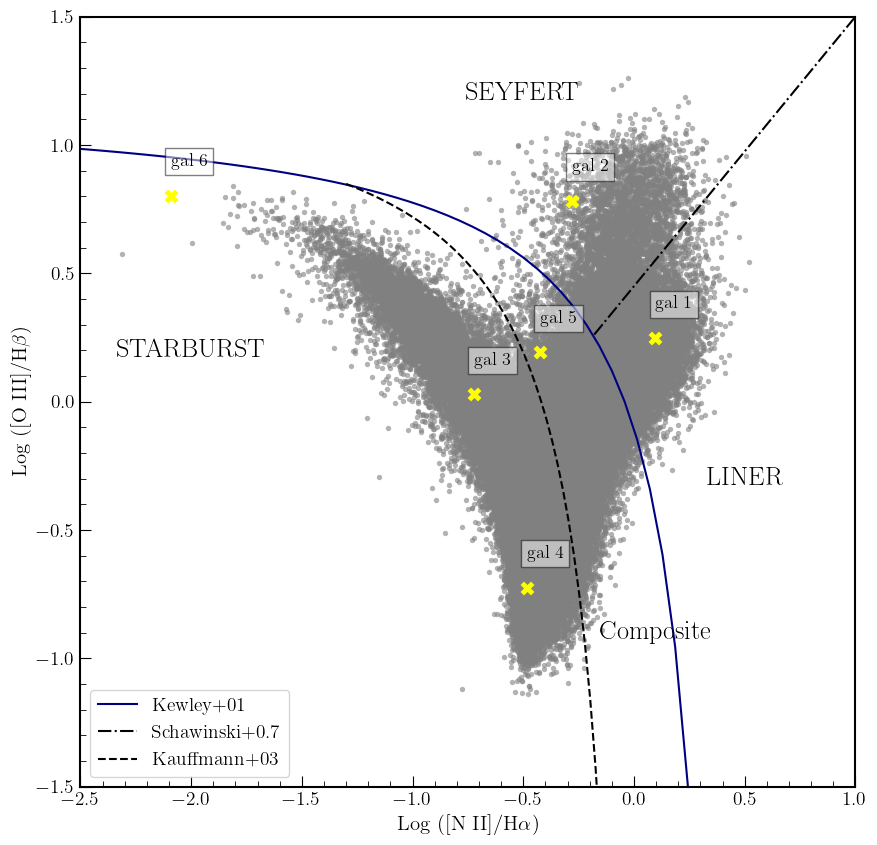

In [32]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(spec['log_NII_Ha'], spec['log_OIII_Hb'], s=15, color='gray', lw=0, alpha=0.6)
ax.scatter(tab['log_NII_Ha'], tab['log_OIII_Hb'], s=100, color='yellow',marker='X', lw=0)

ax.plot(x1,y1, color='navy', linestyle='-', label='Kewley+01')
ax.plot(x4,y4, color='black', linestyle='-.', label='Schawinski+0.7')
ax.plot(xk,yk, '--', color='black', label='Kauffmann+03')

ax.text(float(tab['log_NII_Ha'][0]), float(tab['log_OIII_Hb'][0])+0.1, str(tab['gal_ID'][0]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_NII_Ha'][1]), float(tab['log_OIII_Hb'][1])+0.1, str(tab['gal_ID'][1]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_NII_Ha'][2]), float(tab['log_OIII_Hb'][2])+0.1, str(tab['gal_ID'][2]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_NII_Ha'][3]), float(tab['log_OIII_Hb'][3])+0.1, str(tab['gal_ID'][3]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_NII_Ha'][4]), float(tab['log_OIII_Hb'][4])+0.1, str(tab['gal_ID'][4]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_NII_Ha'][5]), float(tab['log_OIII_Hb'][5])+0.1, str(tab['gal_ID'][5]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))

ax.text(-2.0, 0.2, 'STARBURST', fontsize=19, ha='center', va='center')
ax.text(-0.5, 1.2, 'SEYFERT', fontsize=19, ha='center', va='center')
ax.text(0.5, -0.3, 'LINER', fontsize=19, ha='center', va='center')
ax.text(0.1, -0.9, 'Composite', fontsize=19, ha='center', va='center', weight="bold")

ax.tick_params(axis='both', labelsize=14)
plt.minorticks_on()
ax.set_ylim(-1.5, 1.5)
ax.set_xlim(-2.5, 1)
ax.set_xlabel(r'$\mathrm{Log\ ([N\ II]/H\alpha)}$', fontsize=15)
ax.set_ylabel(r'$\mathrm{Log\ ([O\ III]/H\beta)}$', fontsize=15)
ax.legend(loc=3, fontsize=14)
plt.savefig('bpt_diagrams/BPT_NII_Ha.jpg', bbox_inches='tight')

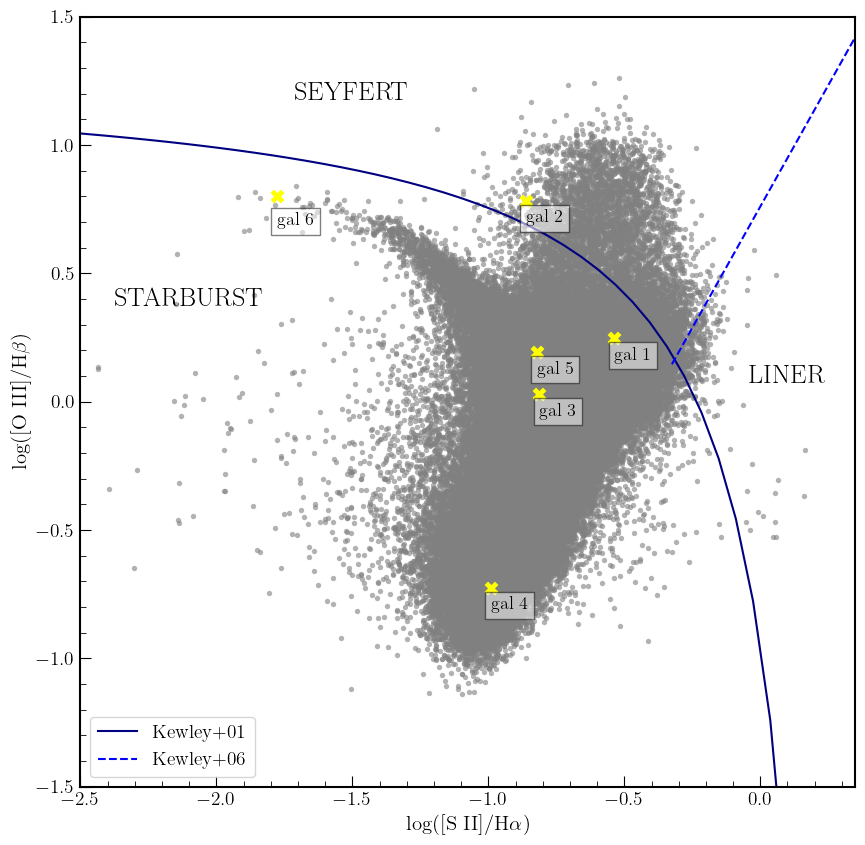

In [33]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(spec['log_SII_Ha'], spec['log_OIII_Hb'], s=15, color='gray', lw=0, alpha=0.6)
ax.scatter(tab['log_SII_Ha'], tab['log_OIII_Hb'], s=100, color='yellow',marker='X', lw=0)

ax.plot(x2,y2, color='navy', linestyle='-', label='Kewley+01')
ax.plot(x_k2,y_k2, color='blue', linestyle='--', label='Kewley+06')


ax.text(float(tab['log_SII_Ha'][0]), float(tab['log_OIII_Hb'][0])-0.1, str(tab['gal_ID'][0]),
       fontsize=13, ha='left', va='center', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_SII_Ha'][1]), float(tab['log_OIII_Hb'][1])-0.1, str(tab['gal_ID'][1]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_SII_Ha'][2]), float(tab['log_OIII_Hb'][2])-0.1, str(tab['gal_ID'][2]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_SII_Ha'][3]), float(tab['log_OIII_Hb'][3])-0.1, str(tab['gal_ID'][3]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_SII_Ha'][4]), float(tab['log_OIII_Hb'][4])-0.1, str(tab['gal_ID'][4]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.56))
ax.text(float(tab['log_SII_Ha'][5]), float(tab['log_OIII_Hb'][5])-0.1, str(tab['gal_ID'][5]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))

ax.text(-2.1, 0.4, 'STARBURST', fontsize=19, ha='center', va='center')
ax.text(-1.5, 1.2, 'SEYFERT', fontsize=19, ha='center', va='center')
ax.text(0.1, 0.1, 'LINER', fontsize=19, ha='center', va='center')


ax.tick_params(axis='both', labelsize=14)
plt.minorticks_on()
ax.set_xlim(-2.5,0.35)
ax.set_ylim(-1.5, 1.5)
ax.set_xlabel(r'$\mathrm{log([S\ II]/H\alpha)}$', fontsize=15)
ax.set_ylabel(r'$\mathrm{log([O\ III]/H\beta)}$', fontsize=15)
ax.legend(loc=3, fontsize=14)
plt.savefig('bpt_diagrams/BPT_SII_Ha.jpg', bbox_inches='tight')

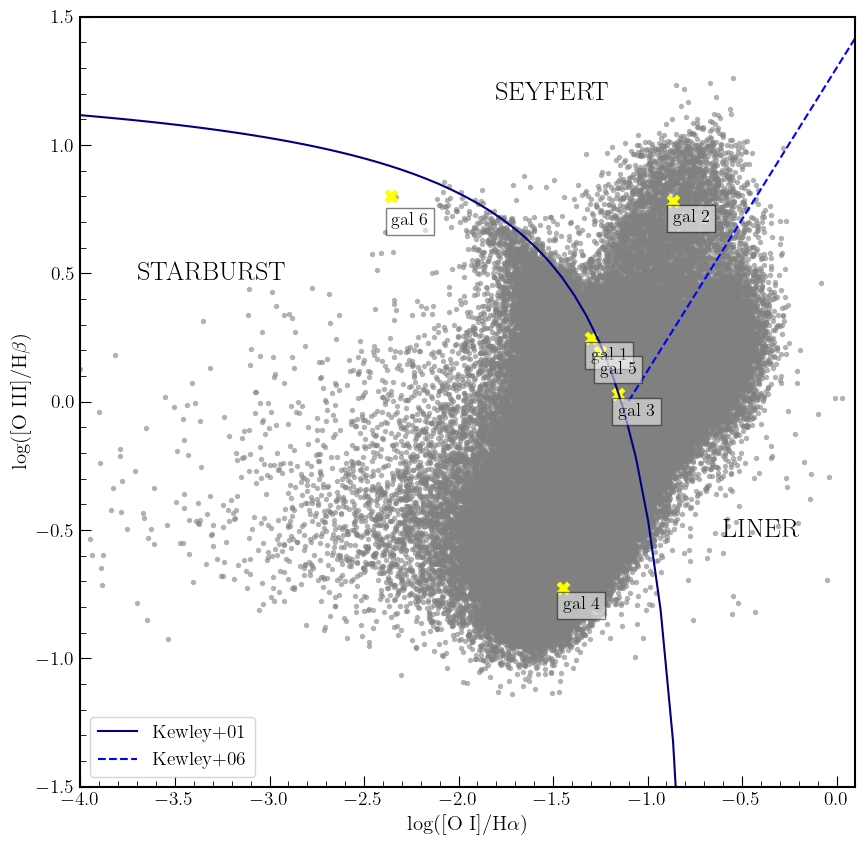

In [34]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(spec['log_OI_Ha'], spec['log_OIII_Hb'], s=15, color='gray', lw=0, alpha=0.6)
ax.scatter(tab['log_OI_Ha'], tab['log_OIII_Hb'], s=100, color='yellow',marker='X', lw=0)

ax.plot(x3,y3, color='navy', linestyle='-', label='Kewley+01')
ax.plot(x_k1,y_k1, color='blue', linestyle='--', label='Kewley+06')


ax.text(float(tab['log_OI_Ha'][0]), float(tab['log_OIII_Hb'][0])-0.1, str(tab['gal_ID'][0]),
       fontsize=13, ha='left', va='center', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_OI_Ha'][1]), float(tab['log_OIII_Hb'][1])-0.1, str(tab['gal_ID'][1]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_OI_Ha'][2]), float(tab['log_OIII_Hb'][2])-0.1, str(tab['gal_ID'][2]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_OI_Ha'][3]), float(tab['log_OIII_Hb'][3])-0.1, str(tab['gal_ID'][3]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))
ax.text(float(tab['log_OI_Ha'][4]), float(tab['log_OIII_Hb'][4])-0.1, str(tab['gal_ID'][4]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.56))
ax.text(float(tab['log_OI_Ha'][5]), float(tab['log_OIII_Hb'][5])-0.1, str(tab['gal_ID'][5]),
       fontsize=13, ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.5))

ax.text(-3.3, 0.5, 'STARBURST', fontsize=19, ha='center', va='center')
ax.text(-1.5, 1.2, 'SEYFERT', fontsize=19, ha='center', va='center')
ax.text(-0.4, -0.5, 'LINER', fontsize=19, ha='center', va='center')


ax.tick_params(axis='both', labelsize=14)
plt.minorticks_on()
ax.set_xlim(-4,0.1)
ax.set_ylim(-1.5, 1.5)
ax.set_xlabel(r'$\mathrm{log([O\ I]/H\alpha)}$', fontsize=15)
ax.set_ylabel(r'$\mathrm{log([O\ III]/H\beta)}$', fontsize=15)
ax.legend(loc=3, fontsize=14)
plt.savefig('bpt_diagrams/BPT_OI_Ha.jpg', bbox_inches='tight')

## ejercicio 4

In [35]:
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=72, Om0=0.27, Tcmb0=2.725)

def L(z,F):
    #Considerando una cosmología estandar, con H0=72
    c = const.c.to('km/s')  # km/s
    H0 = cosmo.H0      # km/s/Mpc
    D = (z*c/H0)**2*(np.power(10,6))**2 *u.pc*u.pc/u.Mpc/u.Mpc * np.power(3.086e+16,2)*u.m*u.m/u.pc/u.pc
    F0 = F*u.W/u.m/u.m *10**(-17)
    L = np.pi*4*F0*D  # L of Ha in watts
    return L

def SFR_rel(L):
    sfr = 7.94e-35 * L *u.Msun/u.yr/u.W
    return sfr

In [36]:
tab['L'] = L(tab['z'],tab['F0_H_ALPHA'])
tab['SFR'] = SFR_rel(tab['L'])
tab

SPECOBJID,gal_ID,NEIII_3869_FLUX,OIII_4363_FLUX,H_BETA_FLUX,H_BETA_EQW,OIII_5007_FLUX,OIII_5007_EQW,OI_6300_FLUX,H_ALPHA_FLUX,H_ALPHA_EQW,NII_6584_FLUX,SII_6731_FLUX,Ha/Hb,c(H_beta),z,z_err,F0_NEIII_3869,F0_OIII_4363,F0_H_BETA,F0_OIII_5007,F0_OI_6300,F0_H_ALPHA,F0_NII_6584,F0_SII_6731,log_OIII_Hb,log_NII_Ha,log_SII_Ha,log_OI_Ha,L,SFR
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,W,solMass / yr
bytes19,str5,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64
318786936665827328,gal 6,151.5907,46.890247,292.9207,-130.95781,2033.6875,-820.94415,3.4491189,849.5434,-540.0383,6.956539,14.948474,2.9002507,0.020367486,0.05682,5e-05,300.33054,33.04059,292.9207,1859.9884,1.8593087,421.8092,3.4056618,7.0482173,0.8027602,-2.0929146,-1.7770368,-2.3557646,2.8255086397286955e+36,224.3453859944584
440342067315501056,gal 3,-0.2901755,-3.3242502,30.666027,-4.8238235,36.884186,-5.204002,6.8996377,110.42702,-20.021482,21.270445,18.172213,3.6009562,0.33574426,0.04437,0.00047,-0.71017003,-2.10217,30.666027,32.81572,3.072738,44.15944,8.350458,6.7915616,0.029424442,-0.7233132,-0.8130539,-1.157498,1.8037674244501267e+35,14.321913350134006
572089958400026624,gal 4,3.8104107,6.511065,86.269966,-3.194571,18.452036,-0.86966145,10.519786,332.29218,-13.47858,110.79253,36.545975,3.8517714,0.4338741,0.04317,0.00301,9.959309,3.9811156,86.269966,16.276352,4.4146676,124.22975,40.60811,12.705736,-0.72430253,-0.48561287,-0.9902258,-1.4493276,4.8036111294419704e+35,38.14067236776924
836713818158557184,gal 1,2.3998368,2.9721792,41.18869,-0.68982756,80.997894,-1.3006185,6.126781,135.02307,-1.7355151,171.4322,41.648205,3.278159,0.19887239,0.04162,0.00086,5.3586273,1.9698946,41.18869,72.93174,2.964346,59.3122,74.06879,17.216988,0.24813858,0.0964912,-0.53718686,-1.3012152,2.1317008846173842e+35,16.92570502386203
1923207523960121344,gal 2,1478.2747,294.56595,2711.3127,-36.164364,18766.66,-237.14308,1318.3838,10980.142,-176.58118,5851.433,1626.3627,4.049751,0.5069204,0.08541,8e-05,4057.5977,175.6513,2711.3127,16448.414,529.3242,3904.3223,2037.7855,535.80023,0.78294444,-0.28238717,-0.86254275,-0.86782384,5.909370741929804e+37,4692.040369092265
2026726824985257984,gal 5,6.378752,2.1028433,45.922924,-4.5703425,79.19446,-7.996519,7.439587,146.681,-17.32046,56.084583,23.389734,3.1940691,0.16100104,0.06646,0.00229,13.886315,1.4119449,45.922924,71.54458,3.6830325,66.12955,24.882797,9.942714,0.19254722,-0.42449635,-0.82289064,-1.25419,6.060303365398942e+35,48.1188087212676


In [37]:
Table([tab['gal_ID'], tab['z'], tab['L'], tab['SFR']]).write('sfr_gals.tex',format='latex', overwrite=True)